# **Building Music Recommendation System using Spotify Dataset**

데이터 이해하기 위해 몇 가지 시각화 프로세스 제시하고 권장 시스템 생성하는 데 관련된 기능 선택할 수 있도록 데이터 분석 수행

# **Import Libraries**

In [ ]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px 
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

# **Read Data**

In [ ]:
data = pd.read_csv("data.csv")
genre_data = pd.read_csv('data_by_genres.csv')
year_data = pd.read_csv('data_by_year.csv')

In [ ]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [ ]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


 **'popularity'**를 타겟으로 모든 분석 진행  
몇 가지 기능 고려해 상관관계 확인(yellowbrick pkg 사용)

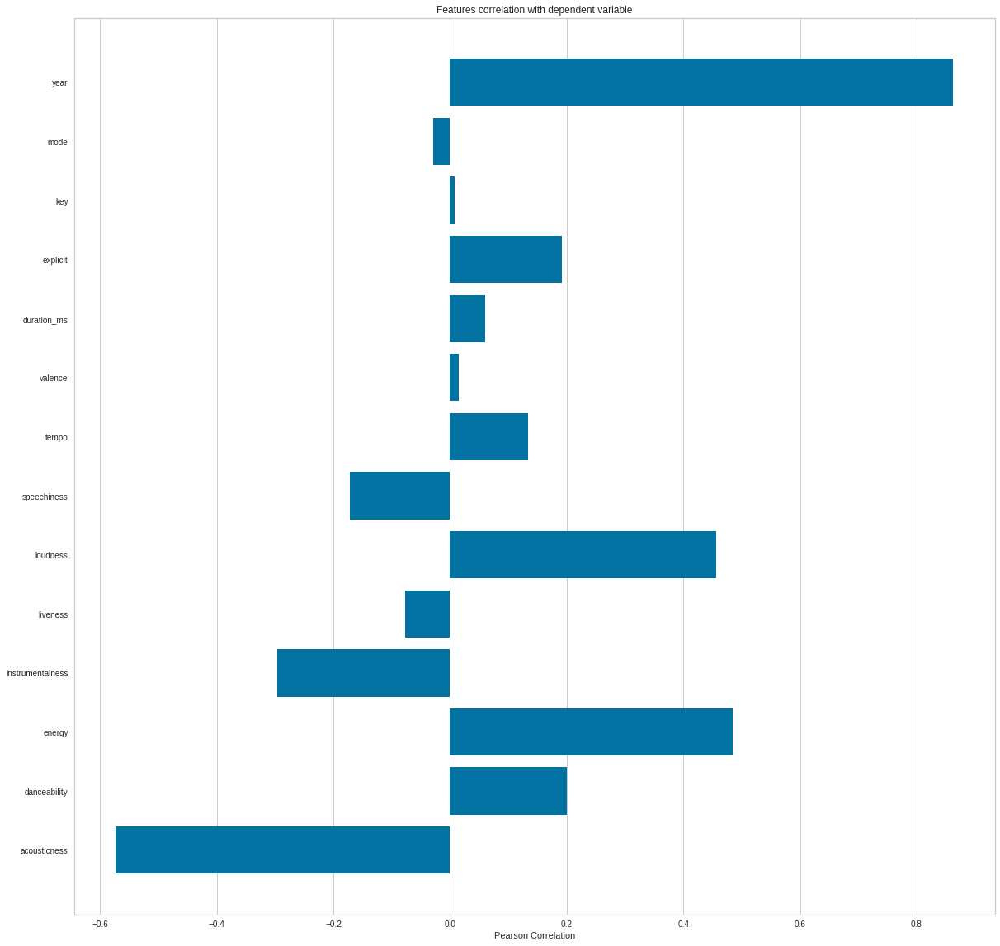

In [ ]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

X, y = data[feature_names], data['popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(20,20)
visualizer.fit(X, y)     # Fit the data to the visualizer
visualizer.show()

# **Data Understanding by Visualization and EDA**

# **Music Over Time**

연도별로 그룹화된 데이터 사용해 1921년부터 2020년까지 전반적인 음악 사운드가 어떻게 변했는지 이해할 수 있음

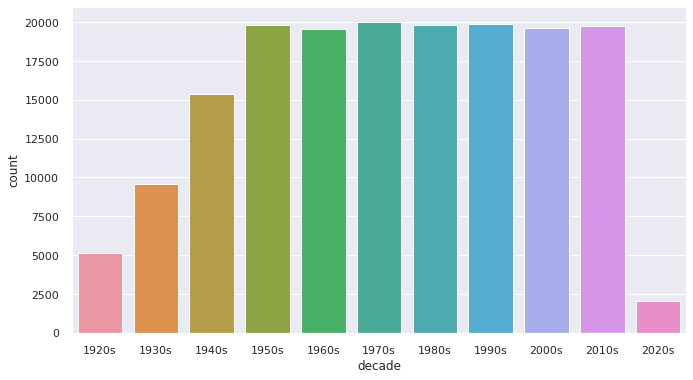

In [ ]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)

sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(data['decade'])

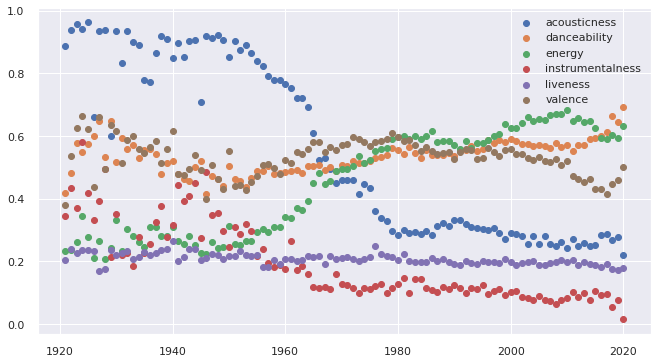

In [ ]:
plot_data = [
    plt.scatter(
        x=year_data['year'],
        y=year_data['acousticness'],
        label="acousticness"
    ),
    plt.scatter(
        x=year_data['year'],
        y=year_data['danceability'],
        label="danceability"
    ),
    plt.scatter(
        x=year_data['year'],
        y=year_data['energy'],
        label="energy"
    ),
    plt.scatter(
        x=year_data['year'],
        y=year_data['instrumentalness'],
        label="instrumentalness"
    ),
    plt.scatter(
        x=year_data['year'],
        y=year_data['liveness'],
        label="liveness"
    ),
    plt.scatter(
        x=year_data['year'],
        y=year_data['valence'],
        label="valence"
    )
]

plt.legend(numpoints=1)
plt.show()

# **Characteristics of Different Genres**

이 데이터셋에는 다양한 장르의 오디오 기능과 다양한 노래의 오디오 기능이 포함되어 있음  
이를 이용해 다양한 장르를 비교하고 사운드의 차이점을 이해할 수 있음  

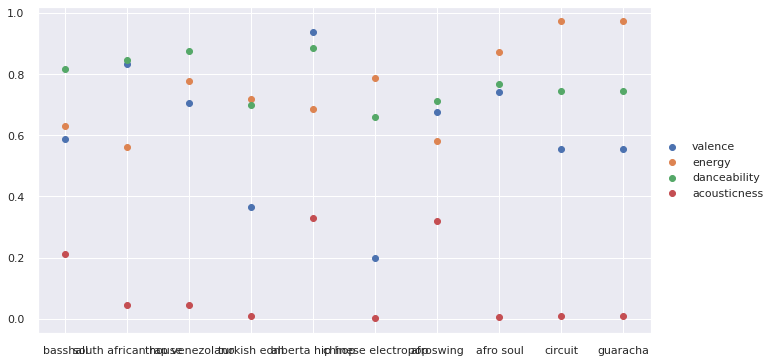

In [ ]:
top10_genres = genre_data.nlargest(10, 'popularity')

plot_DiffGenre_data = [
    plt.scatter(
        x=top10_genres['genres'],
        y=top10_genres['valence'],
        label="valence"
    ),
    plt.scatter(
        x=top10_genres['genres'],
        y=top10_genres['energy'],
        label="energy"
    ),
    plt.scatter(
        x=top10_genres['genres'],
        y=top10_genres['danceability'],
        label="danceability"
    ),
    plt.scatter(
        x=top10_genres['genres'],
        y=top10_genres['acousticness'],
        label="acousticness"
    )
]

plt.legend(loc = 'center left', bbox_to_anchor=(1, 0.5))
plt.show()

# **Clustering Genres with K-Means**

간단한 K-means 클러스터링 알고리즘 사용해 각 장르의 수치 오디오 기능을 기반으로 이 데이터셋 장르를 10개의 클러스터로 나눔

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

In [ ]:
# Visualizing the Clusters with t-SNE

from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.004s...
[t-SNE] Computed neighbors for 2973 samples in 0.282s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.114075
[t-SNE] KL divergence after 1000 iterations: 1.392684


# **Clustering Songs with K-Means**

In [ ]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=20, 
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [ ]:
# Visualizing the Clusters with PCA

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

# **Build Recommender System**

* 분석과 시각화를 기반으로 유사한 장르의 데이터 포인트가 서로 가깝게 위치함과 유사한 유형의 노래도 함께 클러스터링됨을 알 수 있음
* 유사한 장르는 대체적으로 유사하게 들리고 유사한 재생시간 가질 것  
  -> 사용자가 들은 노래의 데이터 포인트 통해 주변 데이터 포인트에 해당하는 노래를 추천함으로써 추천 시스템 구축 가능
* [Spotipy](https://spotipy.readthedocs.io/en/2.16.1/)는 개발자가 쉽게 데이터 가져오고 Spotify 카탈로그에 노래 질의할 수 있게 해주는 Spotify Web API용 Python 클라이언트  
`pip install spotipy` 통해 설치 가능  
* Spotify를 설치한 후에는 [Spotify Developer’s page](https://developer.spotify.com/)에서 앱을 생성하고 Client ID와 secret key를 저장해야 함  

In [ ]:
!pip install spotipy

     |████████████████████████████████| 63 kB 1.9 MB/s 
     |████████████████████████████████| 138 kB 35.2 MB/s 
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [ ]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id="17ef071aa90748faa672993ffff48cfa",
                                                           client_secret="15b2dd41eb1a46e3b37f067ec3c01359"))

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [ ]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):
    
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name']) 
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data
    
    except IndexError:
        return find_song(song['name'], song['year'])
        

def get_mean_vector(song_list, spotify_data):
    
    song_vectors = []
    
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)  
    
    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):
    
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []
    
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
            
    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):
    
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)
    
    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])
    
    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [ ]:
recommend_songs([{'name': 'Come As You Are', 'year':1991},
                {'name': 'Smells Like Teen Spirit', 'year': 1991},
                {'name': 'Lithium', 'year': 1992},
                {'name': 'All Apologies', 'year': 1993},
                {'name': 'Stay Away', 'year': 1993}],  data)

[{'artists': "['Rascal Flatts']",
  'name': 'Life is a Highway - From "Cars"',
  'year': 2009},
 {'artists': "['Metallica']", 'name': 'Of Wolf And Man', 'year': 1991},
 {'artists': "['Keith Urban']", 'name': 'Somebody Like You', 'year': 2002},
 {'artists': "['Marillion']", 'name': 'Kayleigh', 'year': 1992},
 {'artists': "['Los Fugitivos']", 'name': 'Corazón Mágico', 'year': 1995},
 {'artists': "['Passion Pit']", 'name': 'Little Secrets', 'year': 2009},
 {'artists': "['Alice In Chains']", 'name': 'No Excuses', 'year': 1994},
 {'artists': "['Nickelback']",
  'name': 'If Today Was Your Last Day',
  'year': 2008},
 {'artists': "['Def Leppard']", 'name': "Let's Get Rocked", 'year': 1992},
 {'artists': "['Avril Lavigne']",
  'name': "Things I'll Never Say",
  'year': 2002}]

* 마지막 cell은 이런 식으로 추천 음악 리스트 반환함


```
[{'artists': "['Rascal Flatts']",
  'name': 'Life is a Highway - From "Cars"',
  'year': 2009},
 {'artists': "['Metallica']", 'name': 'Of Wolf And Man', 'year': 1991},
 {'artists': "['Keith Urban']", 'name': 'Somebody Like You', 'year': 2002},
 {'artists': "['Marillion']", 'name': 'Kayleigh', 'year': 1992},
 {'artists': "['Los Fugitivos']", 'name': 'Corazón Mágico', 'year': 1995},
 {'artists': "['Passion Pit']", 'name': 'Little Secrets', 'year': 2009},
 {'artists': "['Alice In Chains']", 'name': 'No Excuses', 'year': 1994},
 {'artists': "['Nickelback']",
  'name': 'If Today Was Your Last Day',
  'year': 2008},
 {'artists': "['Def Leppard']", 'name': "Let's Get Rocked", 'year': 1992},
 {'artists': "['Avril Lavigne']",
  'name': "Things I'll Never Say",
  'year': 2002}]
```



* 입맛에 맞게 바꿔봐랏!